<font size=6  color=#003366> <b>[LEPL1109] - STATISTICS AND DATA SCIENCES</b> <br><br> 
<b>Hackathon 04 - Clustering: What is it all about?</b> </font> <br><br><br>

<font size=5  color=#003366>
Prof. D. Hainaut<br>
Prof. L. Jacques<br>

<br><br>
Anne-Sophie Collin   (anne-sophie.collin@uclouvain.be)<br>
Guillaume Van Dessel (guillaume.vandessel@uclouvain.be)<br>
Antoine Legat (antoine.legat@uclouvain.be)<br>
Jérome Eertmans (jerome.eertmans@uclouvain.be)<br>
Maxime Zanella (maxime.zanella@uclouvain.be)<br>
Florine Thiry (florine.thiry@uclouvain.be)<br>
Baptiste Standaert (baptiste.standaert@uclouvain.be)<br>
<div style="text-align: right"> Version 2022</div>

<br><br>
</font>

<div class="alert alert-danger">
    This notebook is meant to be <b>displayed on a web browser</b>. If you are using Visual Studio, or anything else, things might not be displayed as expected. 
</div>

<font size=5 color=#009999> <b>GUIDELINES & DELIVERABLES</b> </font> <br>
-  Copying code or answers from other groups (or from the internet) is strictly forbidden. <b>Each source of inspiration (stack overflow, git, other groups, ...) must be clearly indicated!</b> (We can detect plagiarism)
-  This <b>notebook</b> (".ipynb" file) and the <b>report</b> (".pdf" file) must be delivered on <b>Moodle</b> before **Friday, the 23rd of December 23h59**.
<!--- - We provide you with a <b>latex template of the report</b> which can be found on Moodle. It is <b>mandatory to answer the questions in the spaces provided</b>. Gradescope will not work if answers are outside these spaces.--->
- The <b>grading</b> will be determined based on the <b>quality</b> of your <b>results</b> and your <b>report</b>. <b>Not</b> on the quality of your <b>code</b>. This <b>notebook</b> serves as a basis for the deliverables but it will <b>not</b> be <b>evaluated</b>.<br><br>

<img src="Imgs/pokemon_go.png" width = "600">

<div class="alert alert-danger">
<b>[DELIVERABLE] Summary</b>  <br>
After the reading of this document (and playing with the code!), we expect you to provide us with:
<ol>
   <li> a PDF report written with the LaTeX template available on Moodle. It is <b>mandatory to keep the template as provided</b>;
   <li> and this Jupyter Notebook (it will not be read, just checked for plagiarism);
</ol>

before <b>Friday, the 23rd of December 23h59</b> on Moodle.

<b>Please</b>, export your image in <b>PDF</b> format, not JPEG or PNG, beforing including them in your report.<br> Exporting images in PDF is as simple as using the appropriate filename extension (see example below)!
</div>

```python
# with matplotlib
plt.savefig("my_image.pdf")

# with plotly
fig.write_image("my_image.pdf")
```

<font size=5 color=#009999> <b>CONTEXT & NOTEBOOK STRUCTURE</b> </font> <br>
    
The objective of this hackathon is threefold:
1. extract meaningful information from a dataset;
2. observe relationship(s) (if any) between features and eventual underlying groups (clusters);
3. and develop an unsupervised clustering tool and exploit the associated data.

To this end, you will use a synthetic dataset (available on Moodle) inspired from a real dataset that can be found on [Kaggle](https://www.kaggle.com/datasets/kveykva/sf-bay-area-pokemon-go-spawns). Given a couple of features, you should be able to **create Pokémon clusters based on spatial-temporal coordinates and other prodived features. Then, you must exploit the content of these different clusters to determine the likeliness of capturing a given Pokémon for some provided input requests, such as time and position.**

<img src="Imgs/IllustrationContext.png" width = "800">

Nowadays, mobile games are gaining more and more attention, sometimes [maybe too much](https://www.ouest-france.fr/leditiondusoir/2021-01-21/le-jeu-pokemon-go-aurait-cause-de-nombreux-accidents-de-la-route-et-coute-des-milliards-94619b3e-8c13-40d4-9d2a-ef3705754fe7). This is especially true for the well known [Pokémon GO](https://pokemongolive.com/en/).

> **For those who do not know:** Pokémon GO is a mobile-game in which players have to capture as many Pokémon as possible. Pokémon are creatures that randomly spawn (i.e., appear) at different positions and times, but some locations are more likely to have Pokémon appearing: shopping malls, city centers, parks, and so on. Once a Pokémon has spawned (i.e., appeared), the players have to physically go to the same place as the Pokémon to hopefully capture it.

As a casual Pokémon GO player and a proficient data scientist, you would like to increase your level by leveraging some data-related techniques. To this end, you found a Pokémon GO spawning versus localization dataset that you will use to, hopefully, achieve your goals (see above).

This notebook is organized into three parts. Each of them assesses one fundamental step to solve your problem:

* PART 1 - DATA PREPROCESSING
   - 1.1 - Import the data
   - 1.2 - Features preprocessing
    <br><br>
* PART 2 - DATA VISUALIZATION
   - 2.1 - Dataset exploration
   - 2.2 - Spatial features visualization
   - 2.3 - PCA
    <br><br>
* PART 3 - IT'S TIME TO... CLUSTER!
   - 3.1 - Clustering : definition, example and execution
   - 3.2 - Results analysis

Your answers to the questions in this notebook must be written in your report. We filled this notebook with preliminary (trivial) code. This practice makes possible to run each cell, **up to part 3 (excl.)**, without throwing warnings. <b>Take advantage of this aspect to divide the work between all team members!</b>

Finally, we strongly advise you to <b>read the whole notebook once</b> before jumping in.<br><br>

In [1]:
# This allows you to show/hide the cells with code
# from https://mljar.com/blog/jupyter-notebook-hide-code/

# WARNING: this might not work on Visual Studio Code

from IPython.display import HTML

HTML(
    """<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to show/hide the code."></form>"""
)

In [2]:
"""
CELL N°1: INSTALL DEPENDENCIES
Make sure you have everything installed
"""

import sys
from IPython.utils import io

with io.capture_output() as captured:
    !{sys.executable} -m pip install -r requirements.txt


if "ERROR" in captured.stdout:
    print(captured.stdout)

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

<br><font size=7 color=#009999> <b>PART 1 - DATA PREPROCESSING</b> </font> <br><br>

<font size=5 color=#009999> <b>1.1 - IMPORT THE DATA</b> <br>
Pokémon dataset 
</font> <br> (synthetic dataset inspired from [Pokémon Spawns](https://www.kaggle.com/datasets/kveykva/sf-bay-area-pokemon-go-spawns)) <br>


In this dataset, you are provided some data related to the Pokémon spawns. This includes geolocation, temporal and Pokémon data-related information:

- `type`: refers to different elemental properties associated with each Pokémon
- `lat`: spawn latitude
- `lng`: spawn longitude
- `name`: the Pokémon species
- `date`: time at which the spawn was recorded
- `num`: index of referencing in the Pokédex
- `id`: key for spawn identification
- `appear_duration`: Pokémon appearance time (in seconds), i.e., the time after which the Pokémon disappears

Take a look at the next cell to see the exact composition of the dataset.

In [5]:
"""
CELL N°2: IMPORT THE DATASET
"""
from collections import Counter

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
import toolbox as tb

from IPython.display import display, Markdown as md
from PIL import Image
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn import datasets, preprocessing

pd.set_option("max_colwidth", 200)

path = "Data/pokemon-go-dataset.csv"
df = pd.read_csv(path, parse_dates=["date"])

# Print first rows
display(md("# Pokemon spawns"))
display(df)

# Pokemon spawns

,type,lat,lng,name,date,num,id,appear_duration
0,Normal,37.237011,-121.843019,Pidgey,2022-11-01 00:00:00,16,-4135030893738974896,413.961772
1,Normal,37.754654,-122.203952,Rattata,2022-11-01 00:00:00,19,-6645982803174901936,600.544732
2,Rock,37.469473,-121.756707,Geodude,2022-11-01 00:00:00,74,8067029929788525128,280.745873
3,Normal,37.475244,-122.198679,Doduo,2022-11-01 00:00:00,84,2559157761480675512,828.976142
4,Normal,37.709388,-122.035703,Pidgeotto,2022-11-01 00:00:00,17,-3372987976586331120,282.822751
...,...,...,...,...,...,...,...,...
942310,Normal,37.976597,-122.588604,Rattata,2022-11-03 23:59:59,19,-1822272779879199912,869.103586
942311,Normal,37.897629,-122.501734,Rattata,2022-11-03 23:59:59,19,1572645349480103232,629.813784
942312,Normal,37.362773,-122.029164,Pidgey,2022-11-03 23:59:59,16,-4943393914069504296,479.599486
942313,Ground,37.885425,-122.599945,Diglett,2022-11-03 23:59:59,50,4602880668777754376,183.146139


<br>
<font size=5 color=#009999> <b>1.2 - FEATURES PREPROCESSING</b> <br>
REMOVING UNNECESSARRY INFORMATION, CLEANING DATASET AND CREATING NEW FEATURES
</font> <br> <br>

When doing data sciences, the datasets you are using were most probably not made for your very application. Instead, they result from the collection of information throughout a certain period of time, and it is the data scientist's job to make a good use of those datasets.

For this hackathon, your goal is to **determine the Pokémon individual (i.e., name) that is the most likely to spawn based on position and time requests**. Therefore, you should be able to determine which features are useful for your application.

<div class="alert alert-warning">
<b>[Question 1.1] Removing unnecessary features </b>  <br>
Can you already, a priori, detect that some features are useless?
<ol>
   <li> if yes, list those (useless) features and explain your choice;
   <li> if not, then explain why it is better to wait.
</ol>
    Generally speaking, is it a good idea to remove a feature based on <i>a priori</i> knowledge, or doesn't it alter the final outcome?
</div>

In [6]:
"""
CELL N°3: REMOVING UNNECESSARY FEATURES
If you answered yes in previous question, please remove those features here.

WARNING: removing some features might prevent the following cells to run (especially visualization cells).
Please adapt your code accordingly.
"""

#########################################################################################################
# Start : Student version
#########################################################################################################

features = [
    "id"
]

#########################################################################################################
# End : Student version
#########################################################################################################

# 2. We decided to wait for the num column as maybe we will use a pokedex dataset to get new features for each
# pokemon 

df.drop(labels=features, axis=1, inplace=True, errors="ignore")

<div class="alert alert-info">
<b>[Remark 1.1]</b><br>
In most real-cases, the datasets you are going to work with will contain artifacts, such as typos or missing data, that you may want to remove before feeding the data into any algorithm. Here, Pandas treats missing data as ´NaN´s (refering to Not a Number, even though it is used for every missing object, no only numbers).
</div>

Can you find a way to inspect your dataset and see if there are some missing data?

In [7]:
"""
CELL N°4: INFORMATION ABOUT TYPES AND NANs
Use one (or more) of Pandas' builtin functions to get information about data types
and the number of missing (NaN) values for each feature.
""";

#########################################################################################################
# Start : Student version
#########################################################################################################

df.isna().sum()

#########################################################################################################
# End : Student version
#########################################################################################################


type                   0
lat                    0
lng                    0
name                   0
date                   0
num                    0
appear_duration    18854
dtype: int64

<div class="alert alert-info">
<b>[Remark 1.2] Each problem has its own solution</b> <br>
There exists numerous ways to deal with missing information and we will discuss the two main approaches:
<ol>
   <li> you remove rows or columns that contain missing data;
   <li> or you replace NaNs with another value. The latter can be a fixed value or computed to be the mean of all non-NaNs values. The topic of replacing missing data, also call imputation of missing values, is very broad and complex, and there is no global solution that applies everywhere. Maybe you can find one that works well here?
</ol>
    
You **should** read more about how to imput missing value [here](https://scikit-learn.org/stable/modules/impute.html).
</div> 

<div class="alert alert-warning">
<b>[Question 1.2] Handling missing data </b>  <br>
Given the dataset and the amount / type of missing information, what strategy do you propose to follow regarding missing data (NaNs) ? <br> You can choose one or many of the following:
<ol>
   <li> drop features (column) with missing information; 
   <li> drop samples (row) with missing information;
   <li> replace missing information with interpolation / extrapolation / simple substitution / ...
</ol>
Justify briefly your choice.
</div> 

In [8]:
"""
CELL N°5: HANDLING NANs
Apply your handling NaN strategy by filling the gaps according to what you have decided to do.
Do not reinvent the wheel: a good data-scientist is a lazy d-s.
Feel free to modify the code.
"""

#########################################################################################################
# Start : Student version
#########################################################################################################

# This is an example of how you can drop columns or rows containing NaNs,
# feel free to modify the code if your prefer.

drop_rows = [
    # Fill the list here or leave empty
]
# set drop_rows = None to check for all columns
# set drop_rows = [] to check for no column

drop_cols = [
    # Fill the list here or leave empty
]
# set drop_cols = df.columns to select all columns
# set drop_rows = [] to select no column

# Fill special substitution here (e.g., every NaN becomes an empty string "")
df.fillna(np.nanmedian(df.appear_duration), inplace=True)

#########################################################################################################
# End : Student version
#########################################################################################################


df.dropna(
    axis=0, subset=drop_rows, inplace=True
)  # Drop rows with NaN in any of the mentionned columns

for col in drop_cols:
    # For each mentionned column, drop it if it contains any NaN
    if df[col].isnull().values.any():
        df.drop(col, axis=1, inplace=True)

df

,type,lat,lng,name,date,num,appear_duration
0,Normal,37.237011,-121.843019,Pidgey,2022-11-01 00:00:00,16,413.961772
1,Normal,37.754654,-122.203952,Rattata,2022-11-01 00:00:00,19,600.544732
2,Rock,37.469473,-121.756707,Geodude,2022-11-01 00:00:00,74,280.745873
3,Normal,37.475244,-122.198679,Doduo,2022-11-01 00:00:00,84,828.976142
4,Normal,37.709388,-122.035703,Pidgeotto,2022-11-01 00:00:00,17,282.822751
...,...,...,...,...,...,...,...
942310,Normal,37.976597,-122.588604,Rattata,2022-11-03 23:59:59,19,869.103586
942311,Normal,37.897629,-122.501734,Rattata,2022-11-03 23:59:59,19,629.813784
942312,Normal,37.362773,-122.029164,Pidgey,2022-11-03 23:59:59,16,479.599486
942313,Ground,37.885425,-122.599945,Diglett,2022-11-03 23:59:59,50,183.146139


<div class="alert alert-info">
<b>[Remark 1.3] New features extraction</b> <br>
In the present case, some features in the dataset still need to be reworked in order to provide meaningful information. For example, working with datetimes might not be easy.
</div>

You may want to somehow incorporate the information about date and time into the dataset in a more **intelligent** manner than it was before. Again, there can be multiple solutions, and we will propose you a very simple one.

For example, you may be interested only in the day of a spawn, not the exact second. Other features can also be created, and it is up to you to find the best ones! In the previous hackathon, e.g., you learned about a specific mapping for encoding periodic data.

The following code will show you how to get the day. 

In [9]:
"""
CELL N°6: CREATING FEATURES
Here is how you can extract the date from de datetime feature.
You can create here your own ones!
"""

# E.g., get day information (as a number)
df["day"] = df.date.dt.day

#########################################################################################################
# Start : Student version
#########################################################################################################

df["hour"] = df.date.dt.hour

# Add the features you want
# df.drop("date", axis=1, inplace=True)

#########################################################################################################
# End : Student version
#########################################################################################################


display(
    md(
        "#### Here is how your dataset looks like now that you have added your new feature(s):"
    )
)
df

#### Here is how your dataset looks like now that you have added your new feature(s):

,type,lat,lng,name,date,num,appear_duration,day,hour
0,Normal,37.237011,-121.843019,Pidgey,2022-11-01 00:00:00,16,413.961772,1,0
1,Normal,37.754654,-122.203952,Rattata,2022-11-01 00:00:00,19,600.544732,1,0
2,Rock,37.469473,-121.756707,Geodude,2022-11-01 00:00:00,74,280.745873,1,0
3,Normal,37.475244,-122.198679,Doduo,2022-11-01 00:00:00,84,828.976142,1,0
4,Normal,37.709388,-122.035703,Pidgeotto,2022-11-01 00:00:00,17,282.822751,1,0
...,...,...,...,...,...,...,...,...,...
942310,Normal,37.976597,-122.588604,Rattata,2022-11-03 23:59:59,19,869.103586,3,23
942311,Normal,37.897629,-122.501734,Rattata,2022-11-03 23:59:59,19,629.813784,3,23
942312,Normal,37.362773,-122.029164,Pidgey,2022-11-03 23:59:59,16,479.599486,3,23
942313,Ground,37.885425,-122.599945,Diglett,2022-11-03 23:59:59,50,183.146139,3,23


<div class="alert alert-warning">
<b>[Question 1.3] New features </b>  <br>
What features have you added? If a particular manipulation has been applied, please explain.
</div> 

<br><font size=7 color=#009999> <b>PART 2 - DATA VISUALIZATION</b> </font> <br><br>

Now that we are done with handling and preprocessing the data, we will further dig into the dataset to see what it actually contains.

<br><font size=5 color=#009999> <b>PART 2.1 - DATASET EXPLORATION</b> </font> <br><br>

Bringing an **understanding of data** to data scientists **is crucial**. Visualizing the distributions of each feature generally provides good insight into how that data is distributed. 

There exists plenty of ways for visualizing big amount of data. Indeed, data visualization is a whole branch of data science which aims to make accessible the ways to view and understand data.

Hopefully, there are many amazing tools that allow you to plot those data incredibly. We provide you with three simple examples of those.

In [9]:
"""
CELL N°7: SPAWNS PER DATETIME
"""

fig = df.sample(frac=0.01, random_state=1234)["date"].hist(
    backend="plotly", title="Count of Pokémon spawns per datetime"
)

fig.update_layout(
    xaxis_title="Datetime",
    yaxis_title="Count",
)

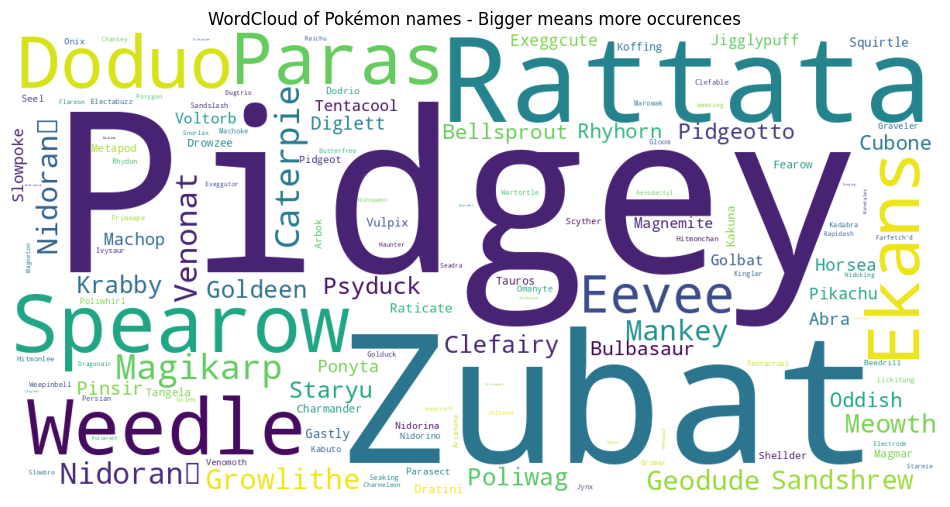

In [10]:
"""
CELL N°8: WORDCLOUD OF POKEMON
"""

counter = Counter(df.name)
tb.word_cloud(
    counter, title="WordCloud of Pokémon names - Bigger means more occurences"
)

In [11]:
"""
CELL N°9: APPEARANCE DURATION
"""

fig = df["appear_duration"].hist(
    backend="plotly", title="Count of Pokémon appearance durations"
)

fig.update_layout(
    xaxis_title="Appearance duration",
    yaxis_title="Count",
)

<div class="alert alert-warning">
<b>[Question 2.1] Features visualization </b> <br>
    
Based on what you have seen above and what you will try, you can already get an idea of which features seem to contain discriminative information, i.e., which features are likely to be more important for the clustering than others. Please, explain.
    
Justify which features you think would be interesting or not to keep in order to reach your goals.
Feel free to try and add your own data visualization to highlight or not their importance.
</div>

<div class="alert alert-info">
<b>[Remark 2.1] Features visualization</b> <br>
As mentioned before, there are many ways to visualize data. 
    
Do not hesitate to support your arguments with original plots to illustrate your point. Feel also free to illustrate the potential new features you have introduced earlier.
</div>

{'Normal': 366087, 'Rock': 16668, 'Water': 96153, 'Dragon': 2280, 'Ground': 35202, 'Grass': 30324, 'Bug': 128529, 'Fairy': 11025, 'Electric': 12564, 'Fighting': 21396, 'Poison': 185553, 'Psychic': 7344, 'Fire': 26121, 'Ghost': 2688, 'Ice': 381}
{'Normal': 164782501.2346087, 'Rock': 7519798.38966547, 'Water': 43273263.00683001, 'Dragon': 991077.956653968, 'Ground': 15822455.127274998, 'Grass': 13567947.899550043, 'Bug': 57815840.95583037, 'Fairy': 4961400.499353566, 'Electric': 5656096.630875923, 'Fighting': 9641210.580724075, 'Poison': 83503684.76959397, 'Psychic': 3280536.5980678387, 'Fire': 11676989.89626144, 'Ghost': 1215587.8003950038, 'Ice': 171636.34906670297}


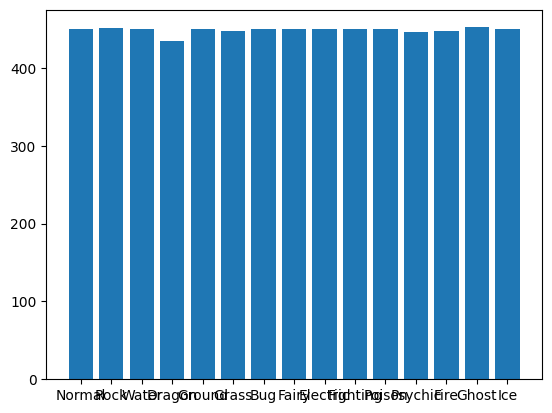

In [12]:
"""
CELL N°10: YOUR OWN VISUALIZATIONS
Feel free to create more plots here (or elsewhere).
"""
count_appearance = {}
total_appearance = {}

for i in range(len(df)):
    if df["type"][i] in count_appearance:
        count_appearance[df["type"][i]] += 1
    else: count_appearance[df["type"][i]] = 1
    
    if df["type"][i] in total_appearance:
        total_appearance[df["type"][i]] += df["appear_duration"][i]
    else: total_appearance[df["type"][i]] = df["appear_duration"][i]

print(count_appearance)
print(total_appearance)

for type in total_appearance:
    total_appearance[type] = total_appearance[type]/count_appearance[type]


names = list(total_appearance.keys())
values = list(total_appearance.values())

plt.bar(range(len(total_appearance)), values, tick_label=names)
plt.show()

<div class="alert alert-info">
<b>[Remark 2.2] Feature pruning</b> <br>
Based on your previous visualizations and choices, reuse the code at the top of the notebook to drop features that are unnecessary. 
</div>

In [ ]:
"""
CELL N°11: REMOVING UNNECESSARY FEATURES
You can use this cell to drop other features you consider unnecessary.
""";


<br><font size=5 color=#009999> <b>PART 2.2 - SPATIAL FEATURES VISUALIZATION</b> </font> <br><br>

As our dataset contains spatial coordinates for each Pokémon spawn, it is therefore imperative to correctly visualize the data concerning the localization of Pokémon.

Since this location information are based on real coordinates, we will be able to visualize this data on real maps. We therefore provide a set of tools that will allow you to observe the distribution of this data on a world map and, more precisely, in San Fransisco.

Further, <a href="https://www.reddit.com/r/pokemongodev/comments/4v3tkt/spawnpoint_classification/">an analysis carried out by redditors on the spawn mechanics</a> of different Pokémon has revealed that, depending on the ground assignment, some pokémon are more likely to spawn. Indeed, it has been observed that the game tends to <b>favor the spawn of certain Pokémon of the same type according to the land cover</b> (e.g., park, forest, industrial site, water point, ...).

Luckily, the tool provided also makes it possible to visualize the land covers distribution. This distribution was carried out on the basis of public data provided by [CORINE Land Cover project](https://land.copernicus.eu/pan-european/corine-land-cover). We will distinguish 8 categories of soil distribution, namely: `forests`, `shrubland`, `herbaceous vegetation`, `herbaceous wetland`, `moss & lichen`, `bar/spare vegetation`, `cropland`, `built-up`, `snow & ice` and `permanent water bodies`.

<div class="alert alert-info">
<b>[Remark 2.3] Land cover</b> <br>
Even if it is possible to obtain those land covers, <b>you are not allowed to use</b> this information for your clustering, it would be too complicated. 
    
However, the fact that Pokémon spawns <b>by type</b> according to the land cover can still be useful for your classification problem... It is up to you to understand how.
</div>

In [10]:
"""
CELL N°12: SAN FRANSISCO VISUALIZATION

Read the code carefully and try to understand it.
"""
sub_df = df.sample(frac=0.001, random_state=1234)

san_fransisco = {
    "lat": 37.573972,
    "lon": -122.431297,
}

fig = px.scatter_mapbox(
    sub_df,
    lat=sub_df.lat,
    lon=sub_df.lng,
    color="name",  # which column to use to set the color of markers
    hover_name="name",  # column added to hover information
    center=san_fransisco,
    mapbox_style="open-street-map",
    color_discrete_sequence=px.colors.qualitative.Dark24,
)

fig.show()

In [13]:
"""
CELL N°13: LAND USE VISUALIZATION

Read the code carefully and try to understand it.
"""

# Land use data from:
# Global land cover - https://lcviewer.vito.be/2019

coordinates = [
    [-123.3085317, 38.5763889],
    [-121.4027778, 38.5763889],
    [-121.4027778, 37.1230159],
    [-123.3085317, 37.1230159],
]

image = Image.open("Data/landuse_sf.tif")

fig = px.scatter_mapbox(
    sub_df,
    lat=sub_df.lat,
    lon=sub_df.lng,
    color="type",  # which column to use to set the color of markers
    hover_name="type",  # column added to hover information
    center=san_fransisco,
    mapbox_style="white-bg",
    color_discrete_sequence=px.colors.qualitative.Dark24,
)

fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": "traces",
            "sourcetype": "image",
            "source": image,
            "coordinates": coordinates,
            "opacity": 0.5,
        }
    ],
)

fig.add_layout_image(
    source="Imgs/land_use_legend.png",
    xref="paper",
    yref="paper",
    x=0,
    y=0.0,
    xanchor="left",
    yanchor="bottom",
    sizex=1,
    sizey=1,
)

<div class="alert alert-warning">
<b>[Question 2.2] Spatial features visualization </b> <br>

Based on the maps above, what can you infer about the spawn locations of the Pokémon? Is there a link between their types and the land cover? If yes, explain. 
</div>
  
<div class="alert alert-warning">
<b>[Question 2.3] Spatial clustering </b> <br>
Based on the maps above, i.e., <i>on the spatial features only</i>, how do you think a clustering will perform according to the number of clusters? In other words, what do you think will happen with 1, 15 (= number of types), 100+ clusters?
</div>

<br>
<font size=5 color=#009999> <b>2.3 - PCA</b> <br>
REDUCE THE DIMENSIONALITY OF THE DATA IN ORDER TO OBSERVE IT
</font> <br> <br>

<!---
The high dimensionality of the dataset (number of columns) makes data visualization hard. In order to gain some (partial) information about our data distribution,
--->
PCA is often considered as the simplest and most fundamental technique used in dimensionality reduction. Remember that PCA is essentially the rotation of coordinate axes, chosen such that each successful axis captures or preserves as much variance as possible. If the algorithm returns a new system coordinates of the same dimension as the input, we can keep only the axis corresponding to the 3 largest singular values and project data on this coordinates system to perform the visualization.


![PCAUrl](https://miro.medium.com/max/400/1*ZXhPoYQIn-Y8mxoUpz5Ayw.gif "PCA")

Although PCA allows to reduce dimensionality for a visualization purpose, it can also give information about the *importance of our features*. Indeed, some of them contribute more to the choice of the principal components and are therefore those that best explain the dataset.

To vizualize the importance of features, we can extract the [PCA loadings](https://scentellegher.github.io/machine-learning/2020/01/27/pca-loadings-sklearn.html). These are indicators of the correlation between components and original features. The value of loadings is contained between -1 and 1. The more the value goes toward those boundaries, the more the feature influences the choice of component.  
We propose to perform a 2-dimensional PCA and then to add the loadings in vector form to the figure to obtain what is called a *biplot* (see example on the iris dataset below). 

>**NOTE**: even if the figure below resembles the previous one, the former displays the directions of the 3 principal components while this one shows the importance of each feature.

In [14]:
"""
CELL N°14: LOADINGS EXAMPLE ON A SEPARATE TOY DATASET
Plot of the reduced iris dataset to 2 dimensions with the loadings (i.e. vectors that represent the importance of each feature)

There is nothing to do here ;-)
"""
iris = datasets.load_iris()

names = iris.target_names

X = preprocessing.scale(iris.data)
y = [names[i] for i in iris.target]

pca = PCA(n_components=2)
X_data2 = pca.fit_transform(X)

tb.biplot_visualization(pca, X_data2, y, columns=iris.feature_names)

Knowing that you will have to predict <b>Pokémon names</b> from spatial and temporal coordinates, you first need to split your dataset into a feature vector (`X`) and a target vector (`y`), then to reduce dimensionality of the feature space to compute and vizualize the loadings.


<div class="alert alert-warning">
<b>[Question 2.4] Feature importance visualization </b>  <br>
    Use the <a href="https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html?highlight=pca#sklearn.decomposition.PCA">PCA</a> function from scikit learn to reduce your data to 2 dimensions. Then, use the <samp>biplot_visualization()</samp> function provided in the toolbox (<i>toolbox.py</i>) to vizualize the biplot graph.

Do all features have the same importance? If no, which features are less important, and why?
You can use all other graphs from the visualization part to justify your answer.
</div>

<div class="alert alert-info">
<b>[Remark 2.4] </b> <br>
Feel free to try this vizualization with numerical features you already dropped (if any) to support your previous choices.
</div>

In [17]:
"""
CELL N°15: FEATURE IMPORTANCE VISUALIZATION

IMPORTANT: only keep numerical features in X (no NaNs). If needed, you can use a mapping function,e.g., from string
to numerical values. Dates are not numbers!
"""

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# First, we recommend using a fraction of the datatest
# and you should remove this (of set frac=1) when you
# feel confident about your model

sub_df = df.sample(frac=0.001, random_state=1234)

output = "type"  # or: output = "type" (see remark 3.3)

# NOTE: if you chose 'type', then you must discard 'name', and vice-versa...
#       ... since predicting Pokémon types from names is trivial ;-)

#########################################################################################################
# Start : Student version
#########################################################################################################

y = sub_df[output]  # target output
X = sub_df.drop(output, axis=1)  # input DataFrame, without output column(s)
columns = [i for i in X.columns if i not in {"name", "num", "date"}]  # a vector of input feature names, usually `X.columns`

# Standardize the data
X = StandardScaler().fit_transform(X[columns])  # do some standardization

# Apply a 2-dimensional PCA
pca = PCA(n_components=2)
X_data2 = pca.fit_transform(X)

#########################################################################################################
# End : Student version
#########################################################################################################


if all(not isinstance(x, type(...)) for x in [pca, X_data2, columns]):
    fig = tb.biplot_visualization(pca, X_data2, y, columns=columns)
    fig.show()

<div class="alert alert-info">
<b>[Remark 2.5] Feature pruning</b> <br>
Based on your previous conclusions you may want to prune other features. If so, reuse the code at the top of the notebook to drop those features. 
</div>

In [ ]:
"""
CELL N°16: REMOVING UNNECESSARY FEATURES
You can use this cell to drop other features you consider unnecessary.
""";


<br> <br>
<font size=7 color=#009999> <b>PART 3 - IT'S TIME TO... CLUSTER!</b> </font> <br><br>

<br>
<font size=5 color=#009999> <b>3.1 - Clustering: definition, example and execution</b> <br>
THE ABC OF CLUSTERING
</font> <br> <br>

Clustering can be defined as the task of *grouping* objects from a set $S$ (here, each row/observation is an object) in such a way that objects assigned to the same group (called cluster) are more **similar** (or less **distant**) with respect to each other (in some sense) than to those assigned to the other groups. Usually, we would like to divide our objects into $K$ groups.

As such, clustering reduces to finding, among all $K$-partitions possible of $S$, the partition $\mathcal{P}$ that minimizes some error criterion $f(\mathcal{P})$. Each object will be assigned a cluster, $C_i$, and each cluster will have its centroid $c_i$ the distance between **any object** in $C_i$ to centroid $c_i$ is **always smaller** that the distance to any other centroid. In other words, each object is assigned to the cluster whose centroid is the closest.


A mathematical formulation of the problem could be the following, $$ \boxed{\min_{(C_1,\dots,C_K) \,\in\, \mathcal{P}}\,f(C_1,\dots,C_K) = \sum_{i = 1}^{K}\,\sum_{x \in C_i}\,\Delta(x,c_i)}$$

where $\Delta(x,c_i)$ denotes the distance between object $x$ and centroid $c_i$.

<br>
<font size=5 color=#009999>
EXAMPLE OF SEPARATING OBJECTS INTO 10 CLUSTERS
</font> <br> <br>

**First**, let us imagine the following 2D dataset.

<img src="Imgs/10-partitions-data.svg" width = "250">

**Then**, a 10-partition is defined by the position of the centroids, one for each cluster. Below, you can observe four examples of (random) centroids localizations (stars).

<img src="Imgs/10-partitions-chose-centroids.svg" width = "1000">

**Next**, the regions are colored based on their closest centroid. Here, we take the distance to be the Euclidean distance.

<img src="Imgs/10-partitions-centroids.svg" width = "1000">

**Finally**, data points (objects) are colored based in the region they are in.

<img src="Imgs/10-partitions-clusters.svg" width = "1000">


As a reminder, for this hackathon, your goal is to determine the Pokémon (i.e., `name` column, i.e., a `str`) that are the most likely to spawn based on position and time requests. Therefore, for each element of the `X_test`, you will have to provide `n = 100` possible Pokémon that could have spawn at that particular location and time.

To do so, you need first to <b>cluster your data</b>, then identify <b>the closest cluster to each element in your test set</b>, and finally **choose from the closest cluster** `n` **Pokémon** `name`**s** that could have spawned there (or nearby).

<div class="alert alert-info">
<b>[Remark 3.1] </b> <br>
In order to evaluate yourself, we have provided in <i>toolbox.py</i> the function <samp>get_ground_truth()</samp> that we will use to create the ground truth vector and return the metric function. Therefore, feel free to create your own validation vector and try your algorithms on it to compare the impact of your design choices.
</div>

In [ ]:
"""
CELL N°17: GROUND TRUTH
Create your own ground truth vector (i.e. split your dataset in train and validation sets)
Reuse X (standardized) and y from previous cell to create those sets.

IMPORTANT: you may want to change between output = "name" and output = "type" (see remark 3.3)
"""

train_indices, val_indices = tb.train_val_indices(X.shape[0], val_frac=0.1, seed=1234)

X_train, X_val = X[train_indices, :], X[val_indices, :]
y_train, y_val = y.values[train_indices], y.values[val_indices]

n = 100

# Return n closest Pokémon (and types) for each entry in X_val
# WARNING: make sure X was generated from sub_df, otherwise update the code
y_true = tb.get_ground_truth(sub_df, sub_df.iloc[val_indices, :], n=n)

y_true[output]

<div class="alert alert-warning">
<b>[Question 3.1] Number of clusters </b>  <br>
    Accounting for all features (i.e., spatial <b>and</b> temporal coordinates), what do you think is the ideal number of clusters? What will happen if too many or even too few clusters are chosen?
</div>

Now that your dataset is divided into a train and a validation set, use the <a href="https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html">KMeans</a> algorithm from `scikit-learn` to apply the clustering on your dataset.

In [ ]:
"""
CELL N°18: KMEANS CLUSTERING
Use KMeans to group your data into k clusters
"""

k = 15  # initial value, you can replace it by whatever you prefer

#########################################################################################################
# Start : Student version
#########################################################################################################

kmeans = ...
cluster_y_train = ...  # predict the cluster index for each sample of X_train

#########################################################################################################
# End : Student version
#########################################################################################################


# We create a DataFrame from train data, that will contain the cluster of each entry
X_train_df = pd.DataFrame(data=X_train, columns=columns)
X_train_df["cluster"] = cluster_y_train
X_train_df[output] = y_train
X_train_df

An easy way of choosing `n` Pokémon among a cluster is to look at the one that spawned the most and provide it `n` times as a possible Pokémon for the entry you have. This is what `top_output_per_cluster` does, i.e., it returns the output that is the most represented for each cluster.

> **NOTE:** this solution is a slightly simple and naive approach to the problem that only takes into account the most represented Pokémon in the cluster. You are invited to implement, if you wish, your own sampling functions within the cluster. You can, for example, provide a more customized result by taking into account the distribution of Pokémon within the cluster itself.<br>
Feel free to try below your own sampling implementations.

<div class="alert alert-warning">
<b>[Question 3.2] Cluster composition </b>  <br>
Do you think the naive approach will give the best results? Justify briefly.

What do you think would be the best way to estimate the Pokémon you encounter? Explain.
</div>

In [ ]:
"""
CELL N°19: PREDICTING POKÉMON
Predict the n possible Pokémon you saw for each elements of your validation set

You are encourage to vary:
- the number of clusters
- the output type ("name" or "type") - (see remark 3.3)
- the way Pokémon are predicted inside the cluster
"""

top_output_per_cluster = X_train_df.groupby(["cluster"]).apply(
    lambda df: df[output].value_counts().idxmax()
)


def predict_pokemon_using_most_present(X_test, n, top_output_per_cluster, kmeans):
    """
    Predicts n Pokémon encountered, for each entry in X_test (can be validation set),
    using the most represented Pokémon in each cluster, and repeating it n times.
    """
    cluster_y_test = kmeans.predict(X_test)
    y_pred = top_output_per_cluster[cluster_y_test]
    y_pred = y_pred.values.reshape(
        -1, 1
    )  # We transform a Pandas DataFrame into a column array
    return np.repeat(y_pred, n, axis=1)


#########################################################################################################
# Start : Student version
#########################################################################################################

# add more tests here

#########################################################################################################
# End : Student version
#########################################################################################################



<br>
<font size=5 color=#009999> <b>3.2 - RESULTS ANALYSIS </b> <br>
OBSERVE AND COMPARE
</font> <br> <br>

In this section, we adress the difficult task of evaluating the performance of the clustering algorithm.


<br>
<b>1. Use a metric function.</b> One way to assess the quality of your data partitionning is to use a metric that compares the predicted vector with the true one according to a well chosen function. For this hackathon, you can find in <i>toolbox.py</i>, the function <samp>accuracy_metric()</samp> that contains the metric we will use to evaluate your solution. The value of the metric lies between 0 and 1, 0 being the worse case and 1 the best.


In [ ]:
"""
CELL N°20: METRIC

Compute the metric on the validation set.
Make sure to select the correct output, i.e., `output="name"` or `output="type".
"""

#########################################################################################################
# Start : Student version
#########################################################################################################

y_pred = predict_pokemon_using_most_present(X_val, n, top_output_per_cluster, kmeans)

accuracy = tb.accuracy_metric(y_pred, y_true[output])

print(
    "Prediction on",
    output,
    "resulted in an average accuracy of",
    np.mean(accuracy),
    f"(std.: {np.std(accuracy)})",
)

#########################################################################################################
# End : Student version
#########################################################################################################



<b>2. Compare different solutions.</b> An import thing to do while looking for an optimal solution is to compare the impact of your changes. Since you have access to the metric function, you should be able to assess the evolution of the metric value according to your choice of hyperparameters, methods, etc.  
> **NOTE:**  graphs are great tools for comparing solutions.

In [ ]:
"""
CELL N°21: COMPARE METHODS
"""
#########################################################################################################
# Start : Student version
#########################################################################################################

# Feel free to use this cell to implement your way of comparing your methods

#########################################################################################################
# End : Student version
#########################################################################################################



**3. Evaluate your solution on unknown data:** Now that you have made all the choices regarding your clustering solution and your model is ready, you need to evaluate it on new data (i.e. not used during the training step). We provide you with a test set containing 100 new inputs with their targets, the 100 closest Pokémon (`name` or `type`). Apply your method to this data and use the metric function to evaluate the results.  
> **NOTE:** do not forget all the preprocessing steps you had to do on the training set before using it as input to your clustering model. 

In [ ]:
"""
CELL N°22: EVALUATE ON TEST DATA
Whenever you feel that your model is ready, you should evaluate on unkwown test data

You are provided with a 100-positions dataset, for which the n=100 closest Pokémon
were computed.
"""

import pickle

X_test = pd.read_csv("Data/data-test-X.csv")
y_test = dict(
    name=np.loadtxt("Data/data-test-y-name.txt", dtype=str, delimiter=","),
    type=np.loadtxt("Data/data-test-y-type.txt", dtype=str, delimiter=","),
)

X_test

#########################################################################################################
# Start : Student version
#########################################################################################################

# evaluate your model(s) on the test data

#########################################################################################################
# End : Student version
#########################################################################################################

<div class="alert alert-warning">
<b>[Question 3.3] Your clustering solution </b> <br> 
Describe here your clustering solution (how many clusters, which method of sampling the Pokémon, other important choices that have been made, etc.). Justify your choices with the help of the metric.
</div>

<div class="alert alert-info">
<b>[Remark 3.2] </b> <br>
Do not hesitate to accompany your explanation with some graphs. You can support your answer by ploting, by example, the evolution of the quality of your predictions according to the number <code>k</code> of clusters.
</div>

<div class="alert alert-info">
<b>[Remark 3.3] </b> <br>
    By default, the target output is set to the Pokémon <code>name</code>. If you create a clustering model that predicts the name of a given Pokémon, you can easily predict its type given a mapping between Pokémon names and their type. This opposite is not true.<br>
    
However, this approach may not be the best if your only goal is to predict Pokémon types, not names. This is why we encourage you to set the output to <code>type</code>, and compare the results between the two approaches. Question 3.4 is dedicated to this comparison.
</div>

<div class="alert alert-warning">
<b>[Question 3.4] Comparing models - BONUS</b> <br> 
Compare how your model performs when predicting the Pokémon types, based on <code>output="type"</code> versus <code>output="name"</code>. I.e., does predicting Pokémon types based on the Pokémon names performs better than directly predicting the types?
</div>


<font size=5 color=#009999>
WELL DONE!
</font>

Now, you should be able to create a complete pipeline, from start to end, that can train a model on a data, and output some prediction for a given input vector. This will be seen during, e.g., the [LELEC2870 - Machine learning : regression, deep networks and dimensionality reduction](https://uclouvain.be/en-cours-2021-lelec2870) classes.